In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt


In [39]:

# Load the dataset
df = pd.read_csv('college_data.csv')
college_count_by_city = df['city'].value_counts()
print(college_count_by_city)




city
pune          25904
mumbai        13099
nagpur        12859
nashik         5604
aurangabad     3273
              ...  
akluj            58
wadwadi          37
ohar             32
sasewadi         20
akkalkuwa        18
Name: count, Length: 101, dtype: int64


In [3]:
# Data Preprocessing
# Convert categorical columns to numerical using Label Encoding
label_encoder = LabelEncoder()
df['branch'] = label_encoder.fit_transform(df['branch'])
df['gender'] = label_encoder.fit_transform(df['gender'])
df['category'] = label_encoder.fit_transform(df['category'])
df['secondary_seat_type'] = label_encoder.fit_transform(df['secondary_seat_type'])
df['score_type'] = label_encoder.fit_transform(df['score_type'])
df['city'] = label_encoder.fit_transform(df['city'])


In [4]:

# Split the data into features (X) and target (y)
X = df.drop(['college_name'], axis=1)
y = df['college_name']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.59


In [6]:

# Print classification report and confusion matrix
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


C:\Users\samarth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\samarth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\samarth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Classification Report:
                                                                                                                                  precision    recall  f1-score   support

                                                                                      a. p. shah institute of technology, thane       0.87      0.91      0.89        95
                                            abhinav education society's college of engineering and technology (degree), wadwadi       1.00      1.00      1.00         9
                                 adarsh shikshan prasarak mandal's k. t. patil college of engineering and technology, osmanabad       0.00      0.00      0.00         0
                                                                                              aditya engineering college , beed       1.00      0.86      0.92        35
                                                                                adsul's technical campus, chas dist. ahmednagar  

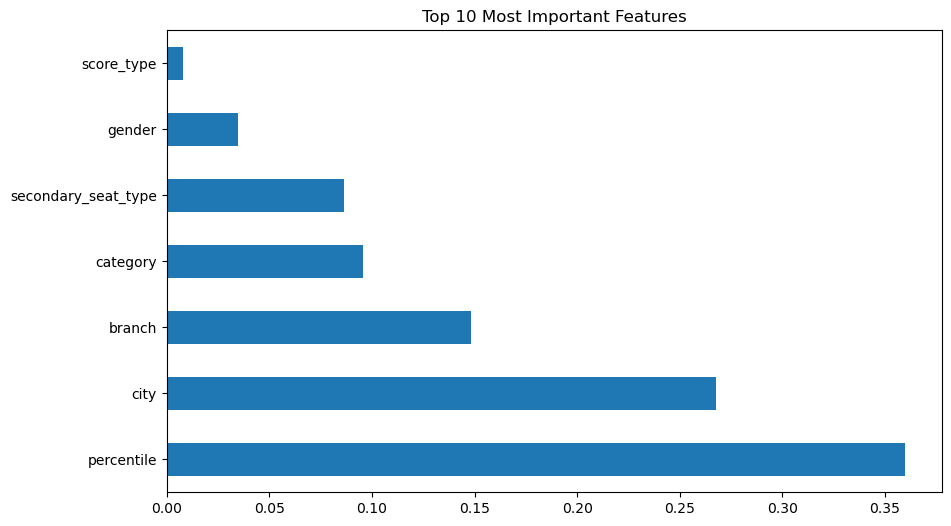

In [7]:

# Plotting
# Plot feature importance
plt.figure(figsize=(10, 6))
feat_importances = pd.Series(clf.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title('Top 10 Most Important Features')
plt.show()



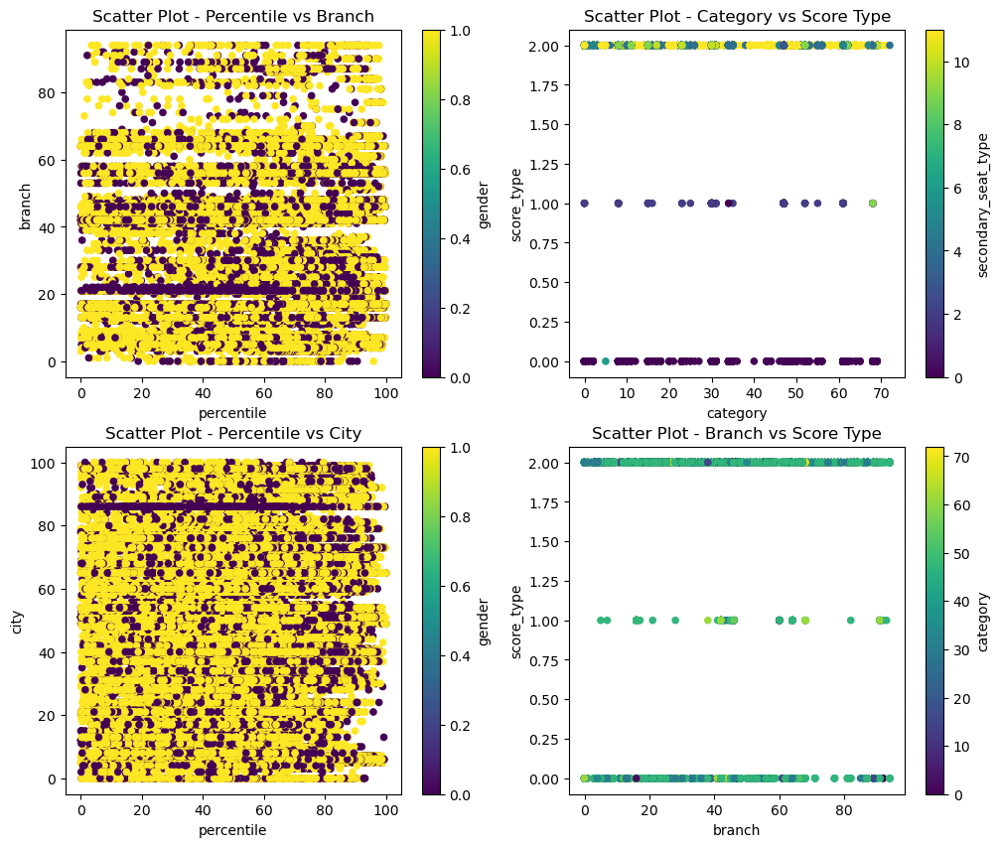

In [8]:
# Plotting a few scatter plots to visualize the data
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
df.plot.scatter(x='percentile', y='branch', c='gender', colormap='viridis', ax=axes[0, 0], title='Scatter Plot - Percentile vs Branch')
df.plot.scatter(x='category', y='score_type', c='secondary_seat_type', colormap='viridis', ax=axes[0, 1], title='Scatter Plot - Category vs Score Type')
df.plot.scatter(x='percentile', y='city', c='gender', colormap='viridis', ax=axes[1, 0], title='Scatter Plot - Percentile vs City')
df.plot.scatter(x='branch', y='score_type', c='category', colormap='viridis', ax=axes[1, 1], title='Scatter Plot - Branch vs Score Type')

plt.show()


In [9]:
import seaborn as sns
from sklearn.metrics import plot_confusion_matrix


ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (C:\Users\samarth\anaconda3\Lib\site-packages\sklearn\metrics\__init__.py)

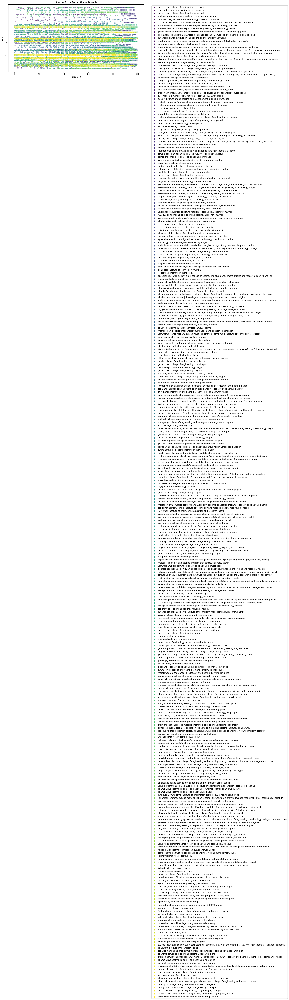

In [10]:
# Scatter Plot - Percentile vs Branch
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='percentile', y='branch', hue='college_name', palette='viridis', alpha=0.6)
plt.title('Scatter Plot - Percentile vs Branch')
plt.xlabel('Percentile')
plt.ylabel('Branch')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

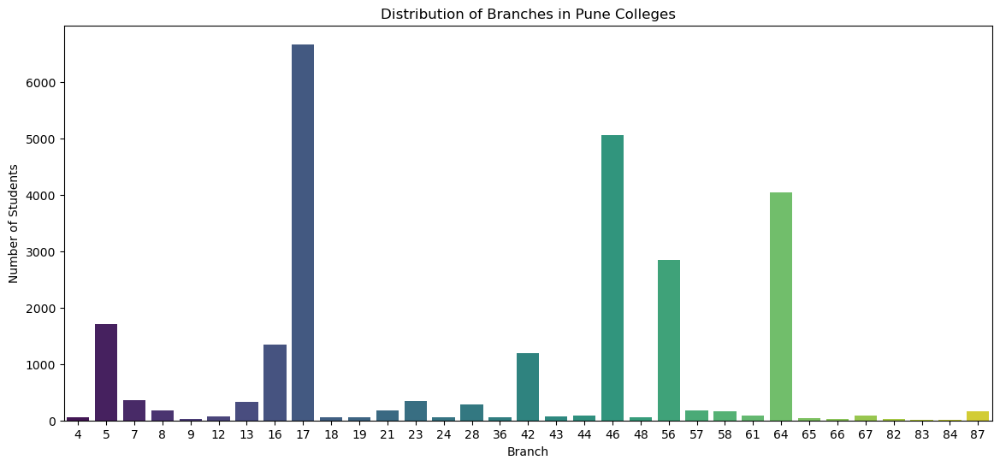

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]]

# Bar Plot - Distribution of Branches in Pune Colleges
plt.figure(figsize=(14, 6))
sns.countplot(data=pune_colleges, x='branch', palette='viridis')
plt.title('Distribution of Branches in Pune Colleges')
plt.xlabel('Branch')
plt.ylabel('Number of Students')
plt.show()



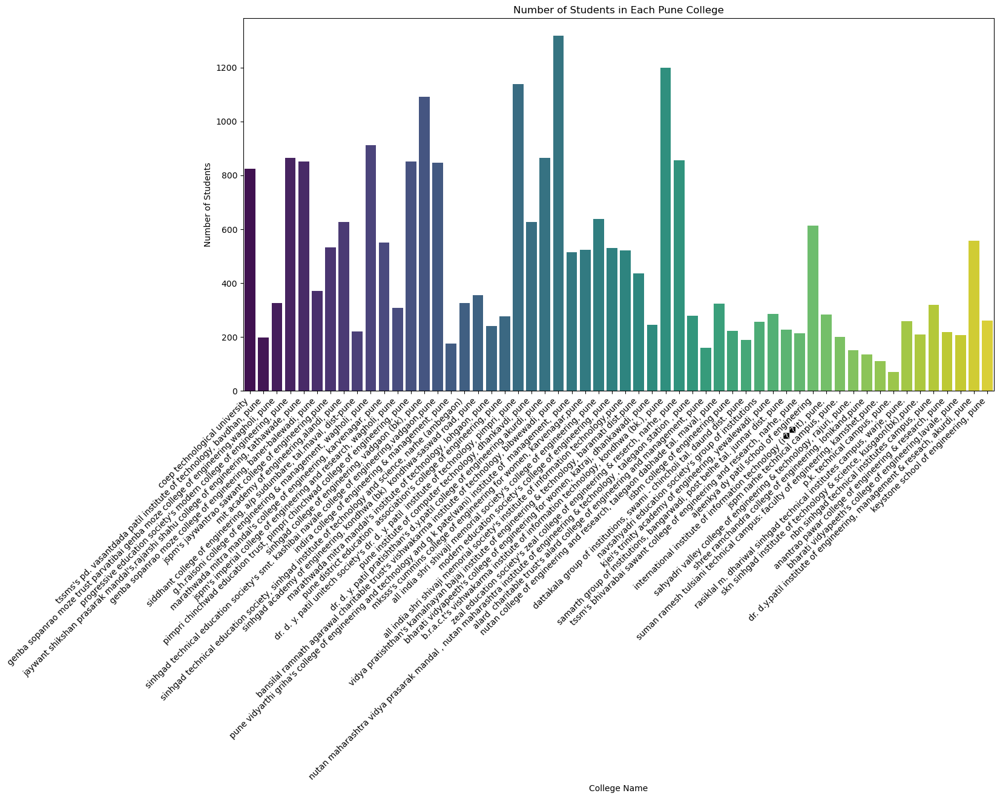

In [12]:
# Count Plot - Number of Students in Each Pune College
plt.figure(figsize=(16, 8))
sns.countplot(data=pune_colleges, x='college_name', palette='viridis')
plt.title('Number of Students in Each Pune College')
plt.xlabel('College Name')
plt.ylabel('Number of Students')
plt.xticks(rotation=45, ha='right')
plt.show()

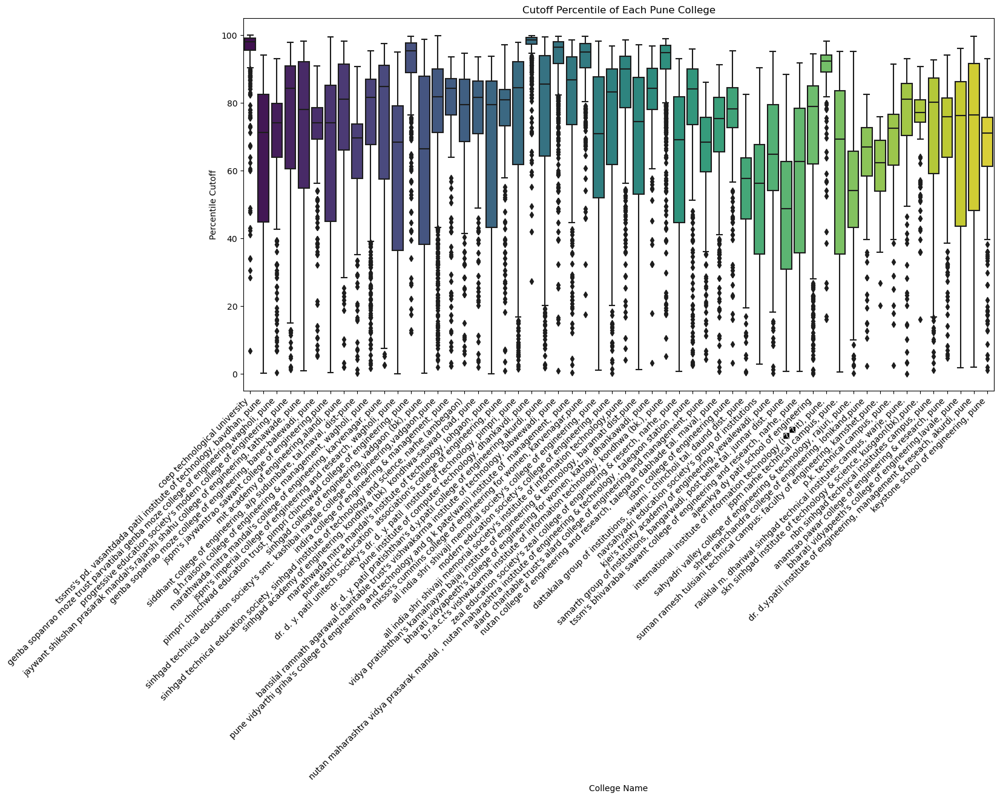

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]]

# Box Plot - Cutoff Percentile of Each Pune College
plt.figure(figsize=(16, 8))
sns.boxplot(data=pune_colleges, x='college_name', y='percentile', palette='viridis')
plt.title('Cutoff Percentile of Each Pune College')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


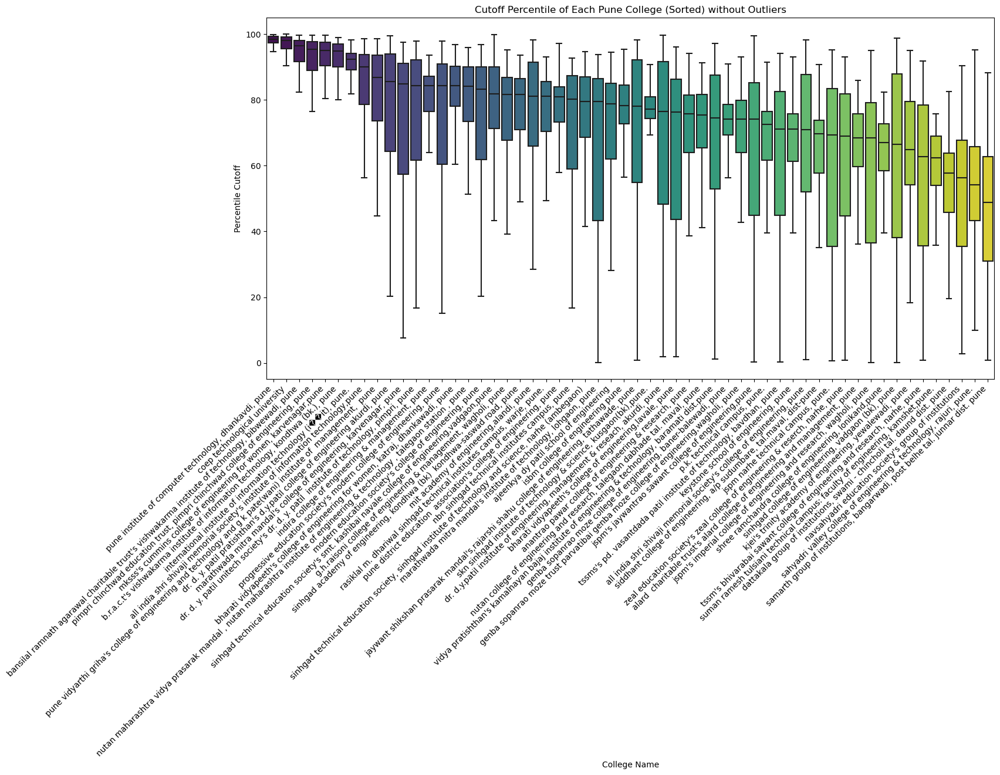

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]]

# Calculate median cutoff percentile for each college
median_cutoffs = pune_colleges.groupby('college_name')['percentile'].median().sort_values(ascending=False).index

# Box Plot - Cutoff Percentile of Each Pune College (sorted) without outliers
plt.figure(figsize=(16, 8))
sns.boxplot(data=pune_colleges, x='college_name', y='percentile', order=median_cutoffs, palette='viridis', sym='')
plt.title('Cutoff Percentile of Each Pune College (Sorted) without Outliers')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


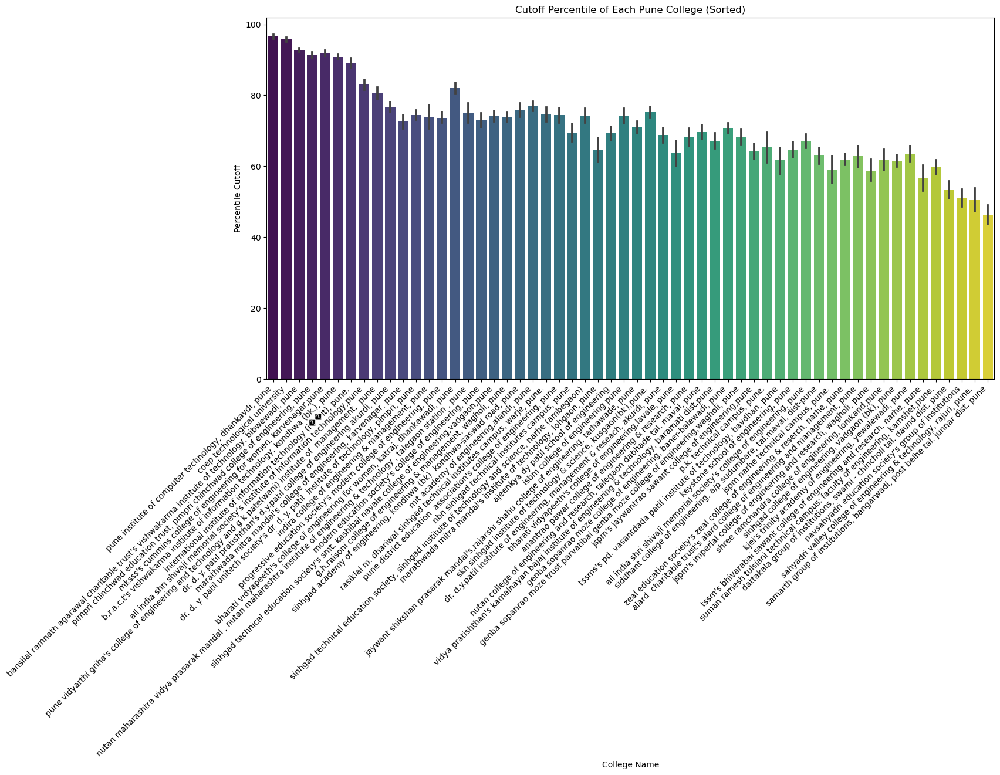

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]]

# Calculate median cutoff percentile for each college
median_cutoffs = pune_colleges.groupby('college_name')['percentile'].median().sort_values(ascending=False).index

# Bar Plot - Cutoff Percentile of Each Pune College (sorted)
plt.figure(figsize=(16, 8))
sns.barplot(data=pune_colleges, x='college_name', y='percentile', order=median_cutoffs, palette='viridis')
plt.title('Cutoff Percentile of Each Pune College (Sorted)')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


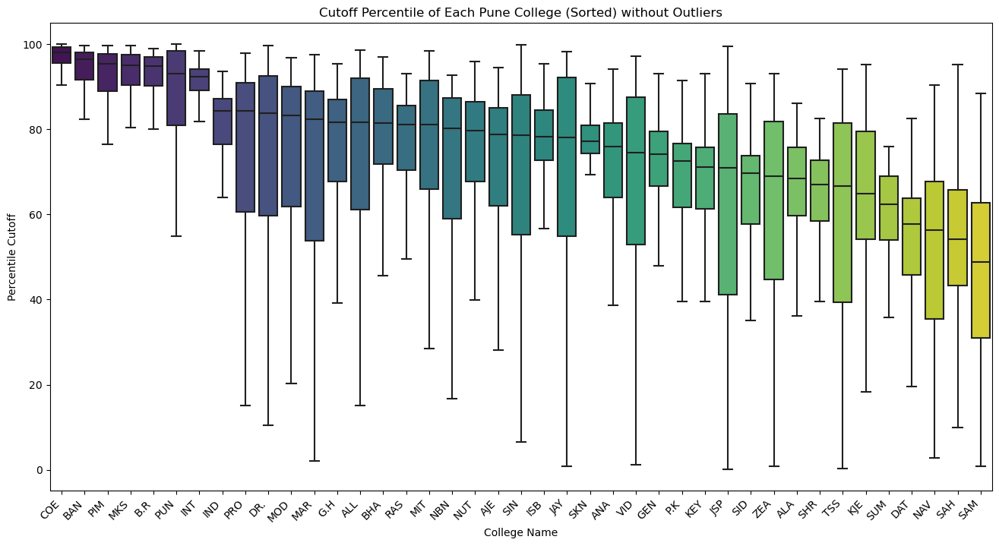

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate short names by taking the first three letters of each college's name
df['college_short_name'] = df['college_name'].apply(lambda x: x[:3].upper())

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]].copy()

# Calculate median cutoff percentile for each college
median_cutoffs = pune_colleges.groupby('college_short_name')['percentile'].median().sort_values(ascending=False).index

# Box Plot - Cutoff Percentile of Each Pune College (sorted) without outliers
plt.figure(figsize=(16, 8))
sns.boxplot(data=pune_colleges, x='college_short_name', y='percentile', order=median_cutoffs, palette='viridis', sym='')
plt.title('Cutoff Percentile of Each Pune College (Sorted) without Outliers')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


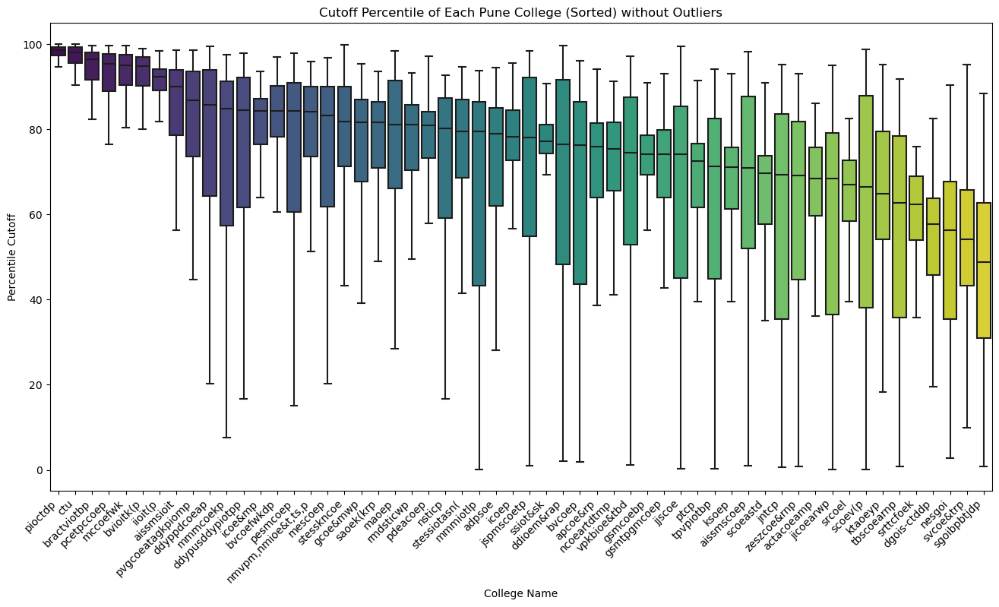

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate short names by taking the first letter of each word in the college's name
df['college_short_name'] = df['college_name'].apply(lambda x: ''.join(word[0].lower() for word in x.split()))

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]].copy()

# Calculate median cutoff percentile for each college
median_cutoffs = pune_colleges.groupby('college_short_name')['percentile'].median().sort_values(ascending=False).index

# Box Plot - Cutoff Percentile of Each Pune College (sorted) without outliers
plt.figure(figsize=(16, 8))
sns.boxplot(data=pune_colleges, x='college_short_name', y='percentile', order=median_cutoffs, palette='viridis', sym='')
plt.title('Cutoff Percentile of Each Pune College (Sorted) without Outliers')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


In [38]:
college_count_by_city = df['city'].value_counts()
print(college_count_by_city)


city
65    25904
49    13099
51    12859
54     5604
7      3273
      ...  
2        58
93       37
57       32
75       20
1        18
Name: count, Length: 101, dtype: int64


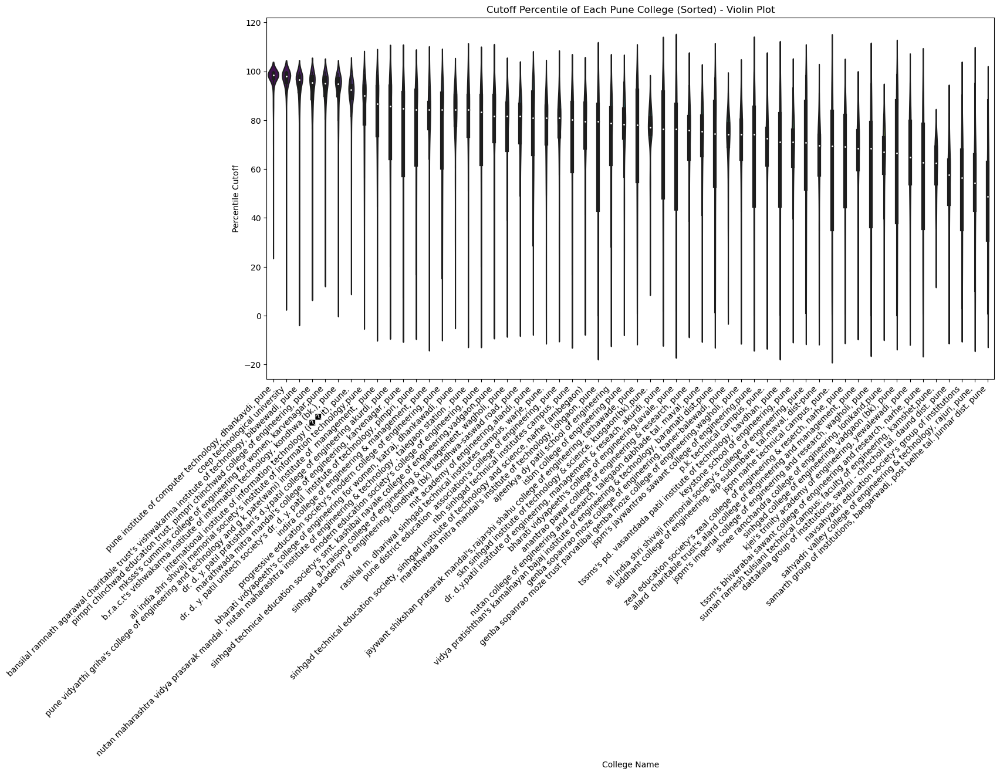

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for colleges in Pune
pune_colleges = df[df['city'] == label_encoder.transform(['pune'])[0]]

# Calculate median cutoff percentile for each college
median_cutoffs = pune_colleges.groupby('college_name')['percentile'].median().sort_values(ascending=False).index

# Violin Plot - Cutoff Percentile of Each Pune College (sorted)
plt.figure(figsize=(16, 8))
sns.violinplot(data=pune_colleges, x='college_name', y='percentile', order=median_cutoffs, palette='viridis')
plt.title('Cutoff Percentile of Each Pune College (Sorted) - Violin Plot')
plt.xlabel('College Name')
plt.ylabel('Percentile Cutoff')
plt.xticks(rotation=45, ha='right')
plt.show()


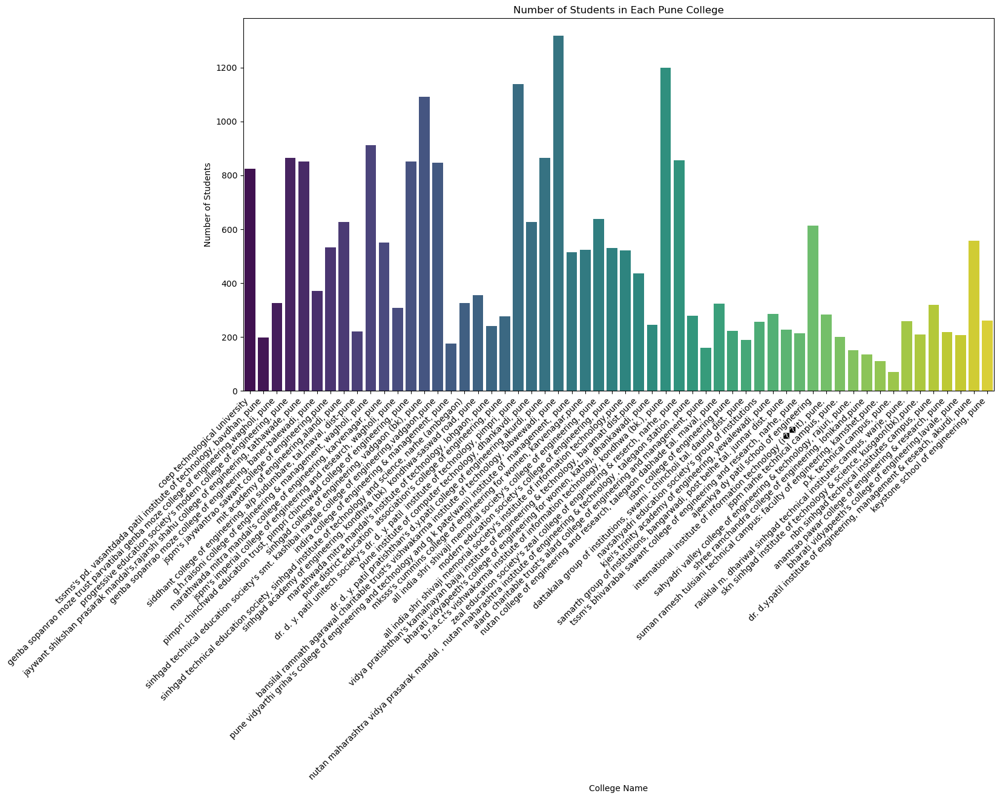

In [28]:
# Count Plot - Number of Students in Each Pune College
plt.figure(figsize=(16, 8))
sns.countplot(data=pune_colleges, x='college_name', palette='viridis')
plt.title('Number of Students in Each Pune College')
plt.xlabel('College Name')
plt.ylabel('Number of Students')
plt.xticks(rotation=45, ha='right')
plt.show()


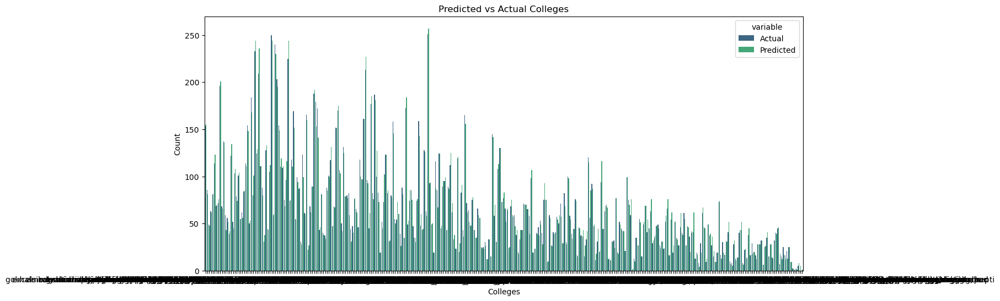

In [20]:
# Bar Plot - Predicted vs Actual Colleges
plt.figure(figsize=(14, 6))
df_results = pd.DataFrame({'Actual': y_test.values, 'Predicted': y_pred})
sns.countplot(data=pd.melt(df_results), x='value', hue='variable', palette='viridis')
plt.title('Predicted vs Actual Colleges')
plt.xlabel('Colleges')
plt.ylabel('Count')
plt.show()


C:\Users\samarth\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


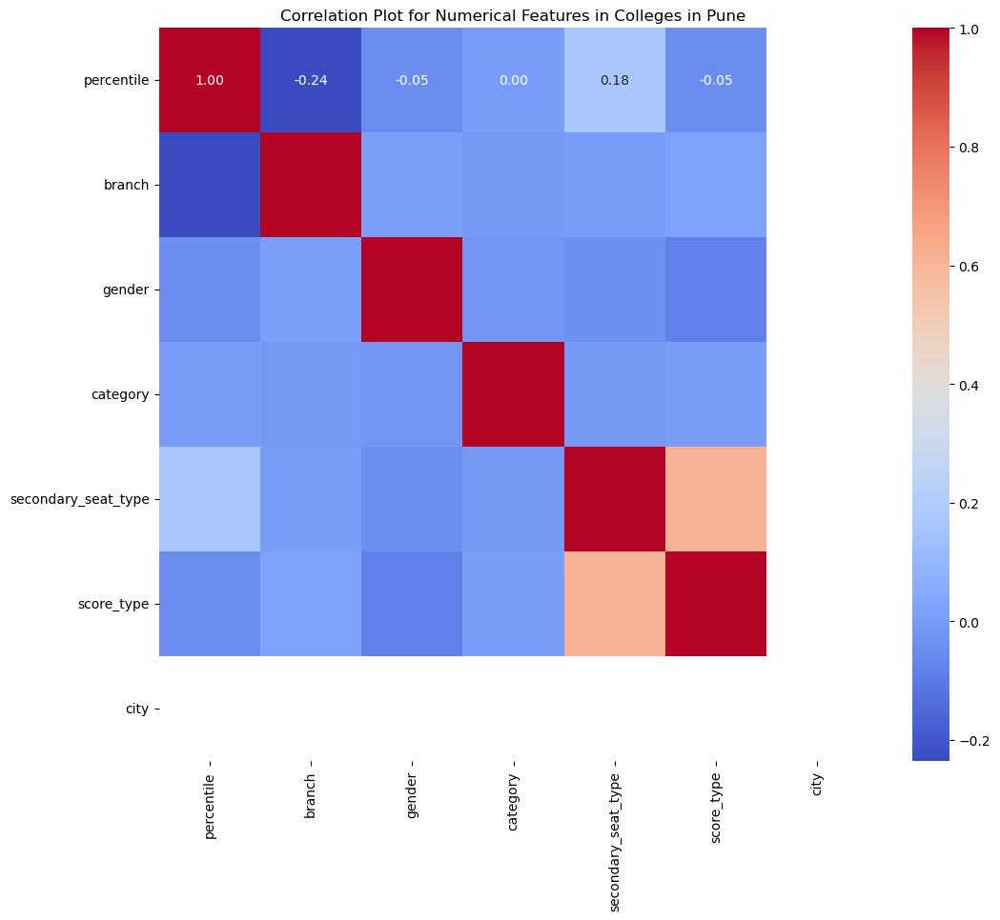

In [22]:
import seaborn as sns

# Filter data for colleges in Pune and select only numerical columns
numerical_cols = pune_colleges.select_dtypes(include='number')
correlation_matrix = numerical_cols.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot for Numerical Features in Colleges in Pune')
plt.show()


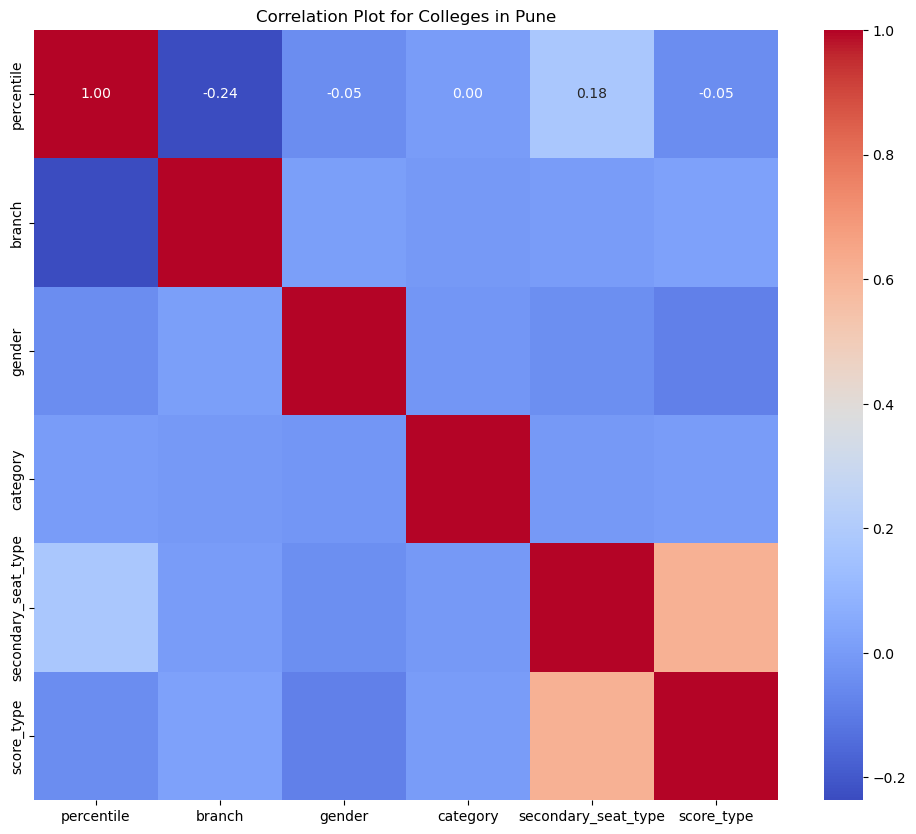

In [23]:
import seaborn as sns

# Filter data for colleges in Pune and drop non-numeric columns
pune_colleges_numeric = pune_colleges.drop(columns=['college_name', 'city'])

# Calculate correlation matrix
correlation_matrix = pune_colleges_numeric.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot for Colleges in Pune')
plt.show()


C:\Users\samarth\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
C:\Users\samarth\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


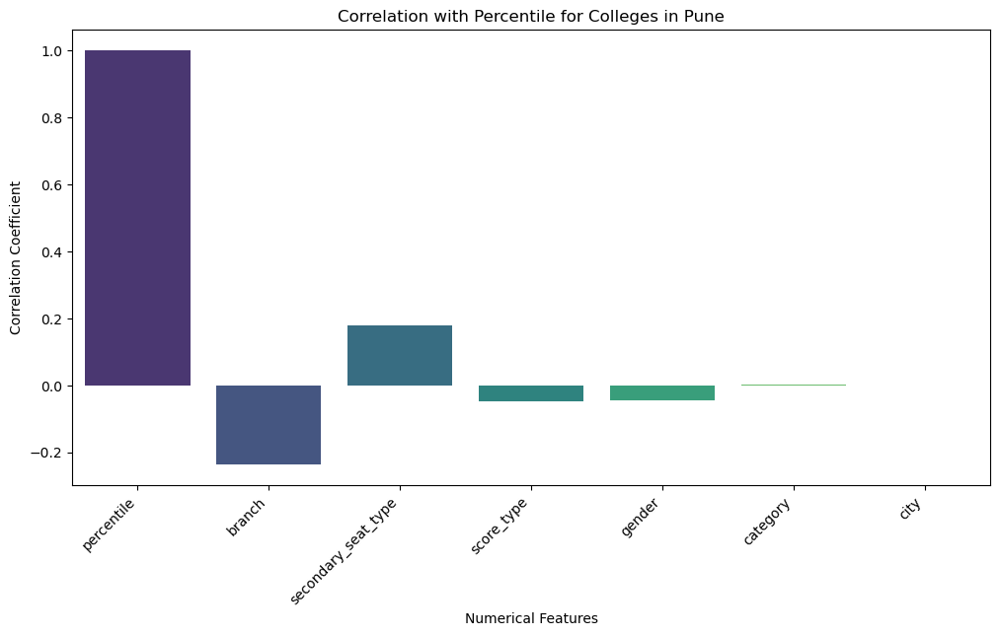

In [24]:
from scipy.stats import pearsonr

# Filter data for colleges in Pune and select only numerical columns
numerical_cols = pune_colleges.select_dtypes(include='number')

# Calculate correlation between each numerical feature and the target variable
correlations = []
for col in numerical_cols.columns:
    corr, _ = pearsonr(pune_colleges[col], pune_colleges['percentile'])
    correlations.append((col, corr))

# Sort correlations by absolute values
correlations.sort(key=lambda x: abs(x[1]), reverse=True)

# Plot the correlation bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=[col[0] for col in correlations], y=[col[1] for col in correlations], palette='viridis')
plt.title('Correlation with Percentile for Colleges in Pune')
plt.xlabel('Numerical Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45, ha='right')
plt.show()


In [25]:
import seaborn as sns

# Calculate correlation between numerical features and the target variable
correlation_with_target = df.corr()['percentile'].sort_values(ascending=False)

# Filter out the target variable
correlation_with_target = correlation_with_target.drop('percentile')

# Plot the correlation bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=correlation_with_target.values, y=correlation_with_target.index, palette='viridis')
plt.title('Correlation with Percentile for All Colleges')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


ValueError: could not convert string to float: 'government college of engineering, amravati'

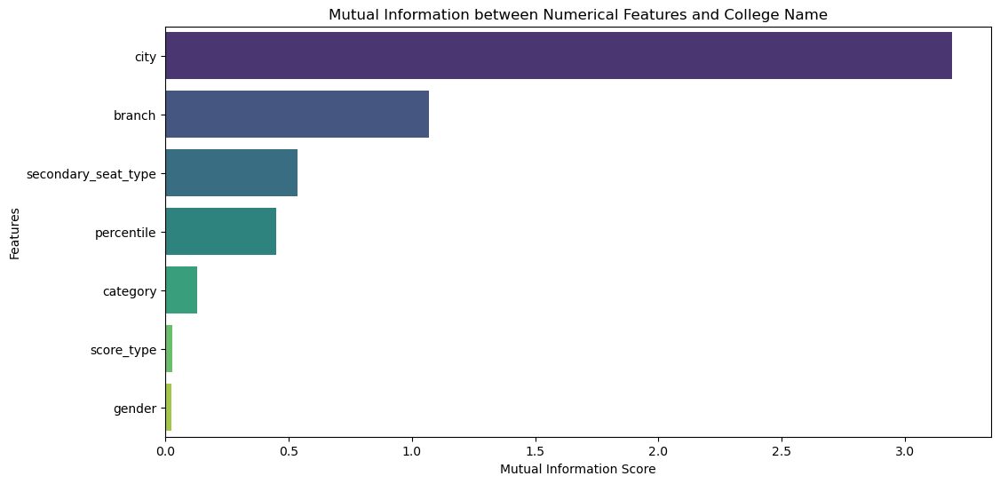

In [27]:
from sklearn.feature_selection import mutual_info_classif

# Select numerical features and the target variable
numerical_cols = df.select_dtypes(include='number')
target_variable = df['college_name']

# Calculate mutual information between numerical features and the target variable
mutual_info_scores = mutual_info_classif(numerical_cols, target_variable)

# Create a DataFrame for plotting
mi_df = pd.DataFrame({'Feature': numerical_cols.columns, 'Mutual_Info_Score': mutual_info_scores})
mi_df = mi_df.sort_values(by='Mutual_Info_Score', ascending=False)

# Plot the mutual information scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Mutual_Info_Score', y='Feature', data=mi_df, palette='viridis')
plt.title('Mutual Information between Numerical Features and College Name')
plt.xlabel('Mutual Information Score')
plt.ylabel('Features')
plt.show()
